In [6]:
# Import a bunch of helpful modules for visualizing
import IPython.display as ipd
import librosa
import matplotlib.pyplot as plt
import librosa.display
%matplotlib inline
import numpy as np

In [38]:
# Import the tool class
from tool_class import *

In [3]:
# Let's create a simple tool based on the pre-trained model_general
# We'll also create a sample library based on a directory containing drum sounds; 
# This will take a while the first time you run it since it needs to calculate embeddings for all samples
# You can leave the library_dir parameter out to skip this, but won't be able to do similarity search
tool = SoundSampleTool('model_drum_classes', library_dir='/Users/Shared/Maschine 2 Library/Samples/Drums')

Loading existing parameters.
model_drum_classes/params.json
Creating model.

For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Colocations handled automatically by placer.
Model created.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Setting up session.
Session set up.
Trying to restore saved checkpoints from model_drum_classes ...  Checkpoint found: model_drum_classes/model.ckpt-2603
  Global step was: 2603
Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from model_drum_classes/model.ckpt-2603
 Done.
Constructing library based on directory /Users/Shared/Maschine 2 Library/Samples/Drums.
Total number of samples found in library: 8274
Fo

In [4]:
# Let's also define a function for easy visualization of audio files
# (For some reason might have to run the first cell again after this to actually display figures in line)
def visualize_audio(audio_file):
    # Waveform
    x, sr = librosa.load(audio_file, duration=2.0)
    plt.figure(figsize=(14, 5))
    librosa.display.waveplot(x, sr=sr)
    plt.xlim([0,2.0])
    
    # Spectrogram
    sr = tool.param['SAMPLING_RATE']
    N_FFT = tool.param['N_FFT']
    HOP_LENGTH = tool.param['HOP_LENGTH']
    spec = np.squeeze(tool.get_features(audio_file))
    plt.figure(figsize=(14, 5))
    librosa.display.specshow(spec, sr=sr, x_axis='time', y_axis='hz', hop_length=HOP_LENGTH)
    
    ipd.display(ipd.Audio(audio_file))

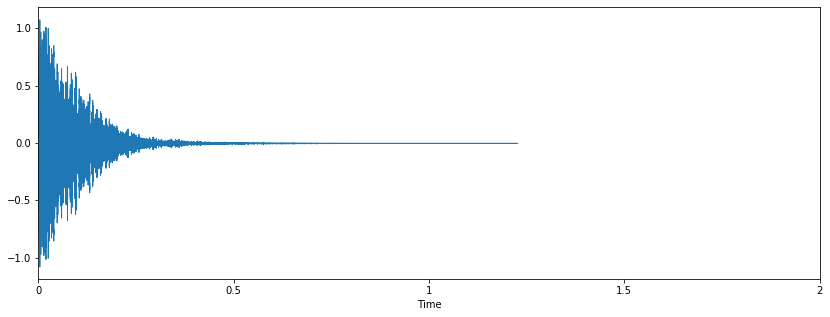

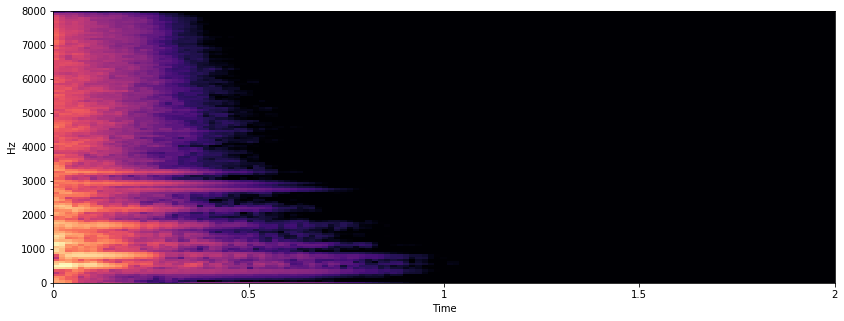

In [7]:
# Test it on a simple snare sound
snare_file = '/Users/Shared/Maschine 2 Library/Samples/Drums/Snare/Snare Downbeat 1.wav'
visualize_audio(snare_file)

10 most similar samples to /Users/Shared/Maschine 2 Library/Samples/Drums/Snare/Snare Downbeat 1.wav:
1 - /Users/Shared/Maschine 2 Library/Samples/Drums/Snare/Snare Downbeat 1.wav at 0.0 (dist = 0.0)
2 - /Users/Shared/Maschine 2 Library/Samples/Drums/Snare/Snare AR70sOpen V65 3.wav at 0.0 (dist = 1.506729245185852)
3 - /Users/Shared/Maschine 2 Library/Samples/Drums/Snare/Snare AR70sOpen V77 3.wav at 0.0 (dist = 1.8026195764541626)
4 - /Users/Shared/Maschine 2 Library/Samples/Drums/Snare/Snare AR70sOpen V127 3.wav at 0.0 (dist = 1.8361653089523315)
5 - /Users/Shared/Maschine 2 Library/Samples/Drums/Snare/Snare AR70sOpen V88 3.wav at 0.0 (dist = 1.8407222032546997)
6 - /Users/Shared/Maschine 2 Library/Samples/Drums/Hihat/PedalHH AR50sAutumn V127.wav at 0.0 (dist = 1.8615816831588745)
7 - /Users/Shared/Maschine 2 Library/Samples/Drums/Hihat/PedalHH ARVintageEbony V127.wav at 0.0 (dist = 1.872515082359314)
8 - /Users/Shared/Maschine 2 Library/Samples/Drums/Snare/Snare OrchPerc 1 V2.wav at 

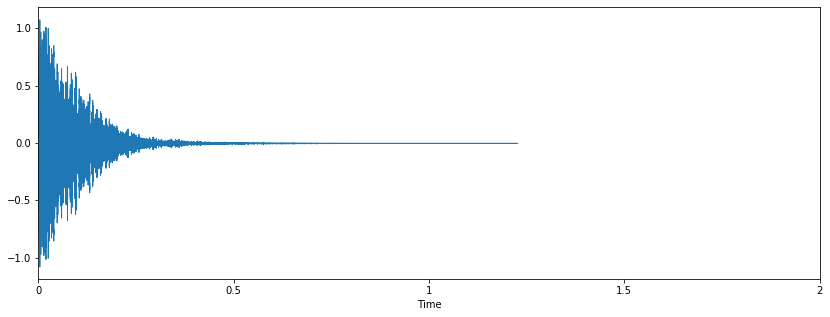

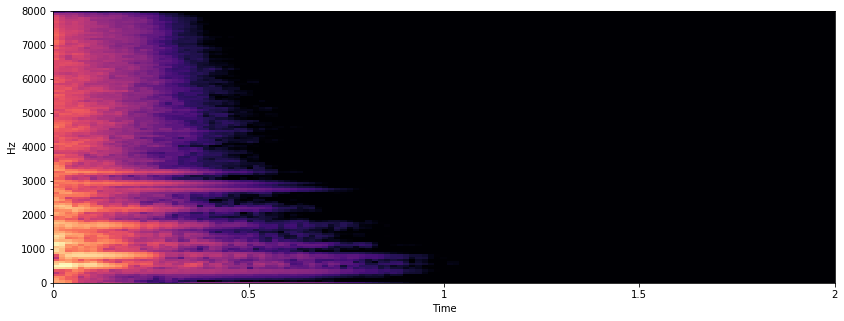

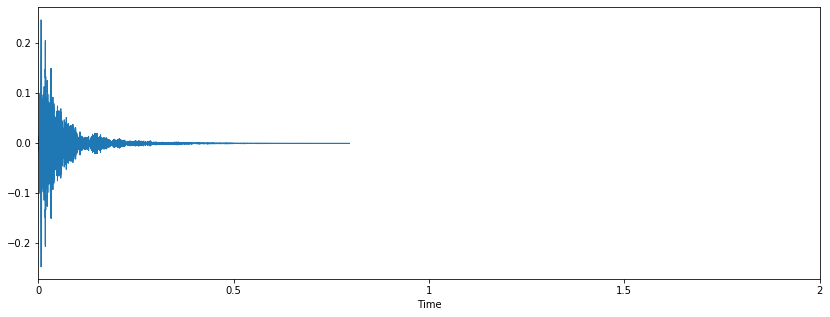

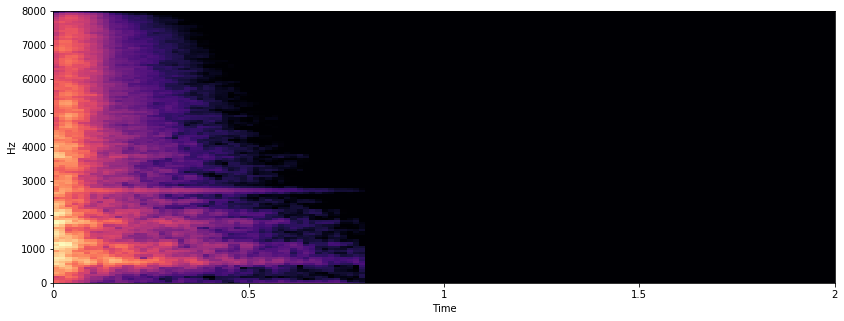

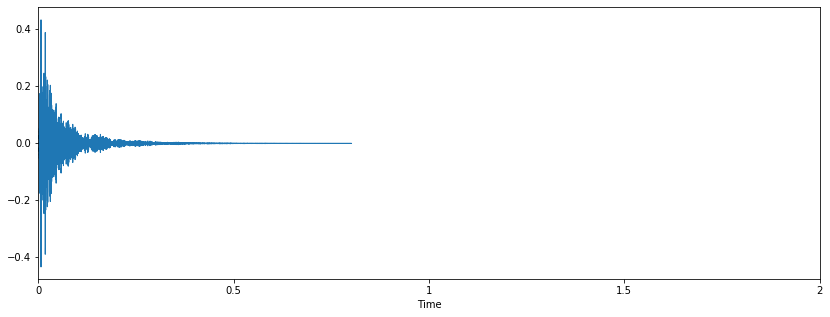

...

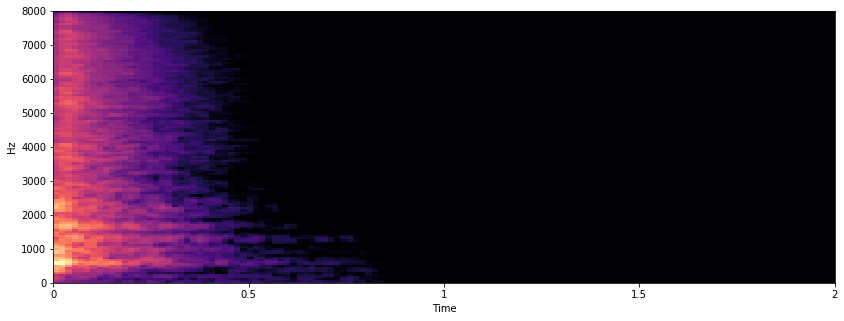

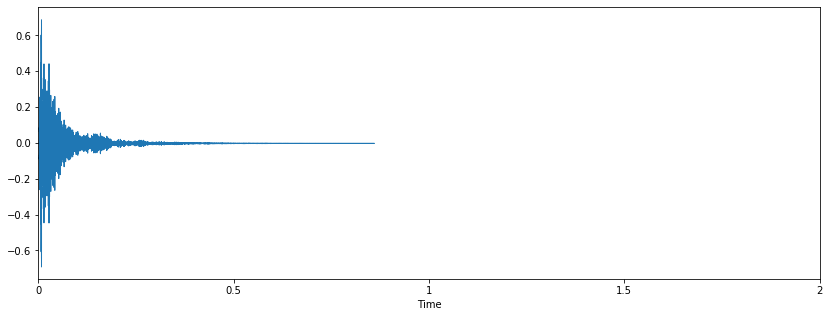

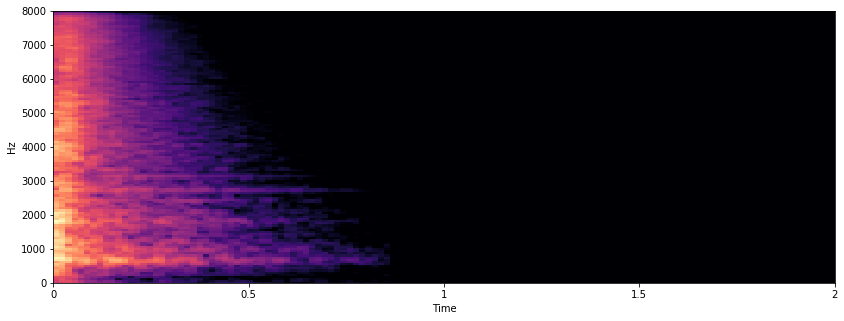

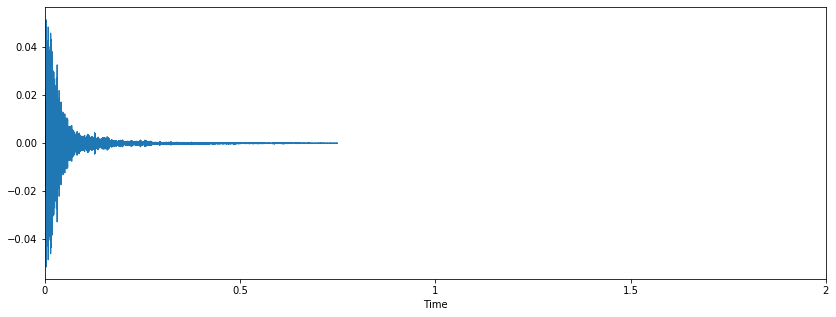

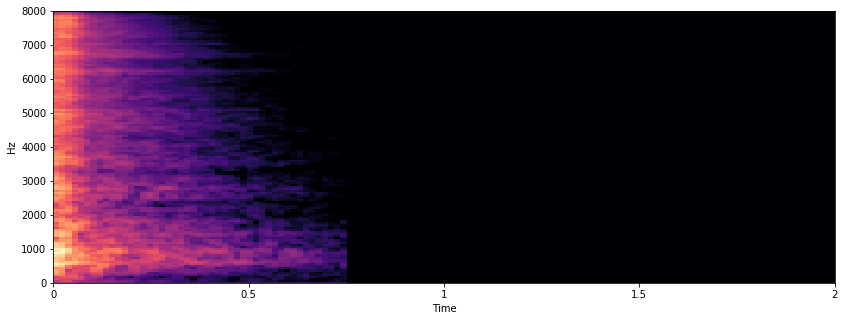

In [9]:
similar_files, onsets, distances = tool.find_similar(snare_file, num_similar=10)

for file in similar_files:
    visualize_audio(file)

In [12]:
# Let's test the prediction and see that our snare is actually recognised as a snare
probabilities, most_likely_class = tool.predict(snare_file)
print('Most likely class: ', most_likely_class)
for k, c_name in enumerate(tool.class_names):
    print(f'Probability of {c_name}: {probabilities[k]}')

Most likely class:  1_snare
Probability of 0_kick: 0.000771034334320575
Probability of 1_snare: 0.8886090517044067
Probability of 2_hihat_closed: 0.009634561836719513
Probability of 3_hihat_open: 0.0012935732956975698
Probability of 4_tom_low: 0.0056909522973001
Probability of 5_tom_mid: 0.02314443700015545
Probability of 6_tom_high: 0.06373973190784454
Probability of 7_clap: 0.000727868580725044
Probability of 8_rim: 0.006388723384588957


No input file given; sampling random point in latent space.
Decoding averaged embedding.
Reconstructing audio.


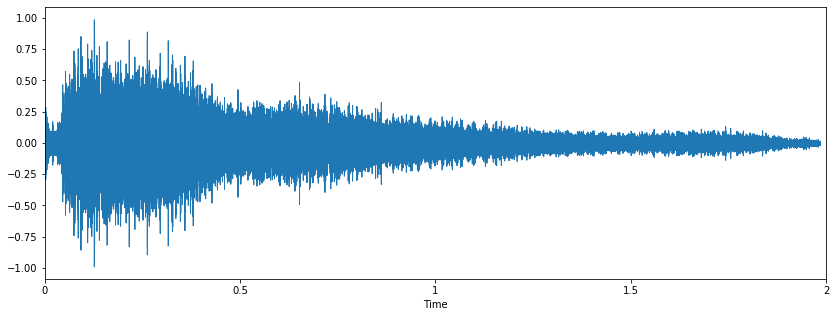

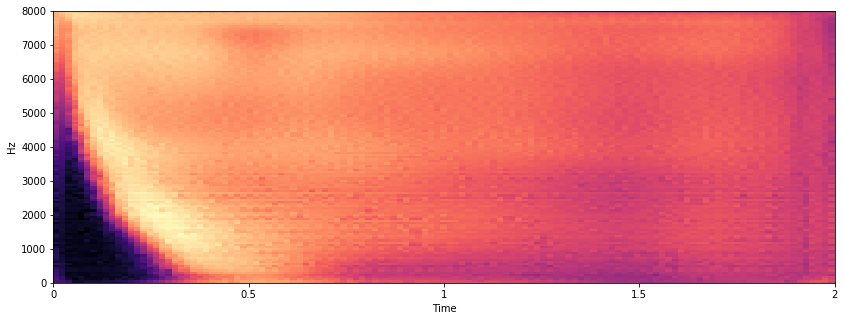

In [17]:
# We can now play around with audio generation
# First, let's generate a random audio file by sampling from latent space
filename = 'random.wav'
tool.generate(filename)
visualize_audio(filename)

Calculating embeddings for file 1 of 1
Decoding averaged embedding.
Reconstructing audio.


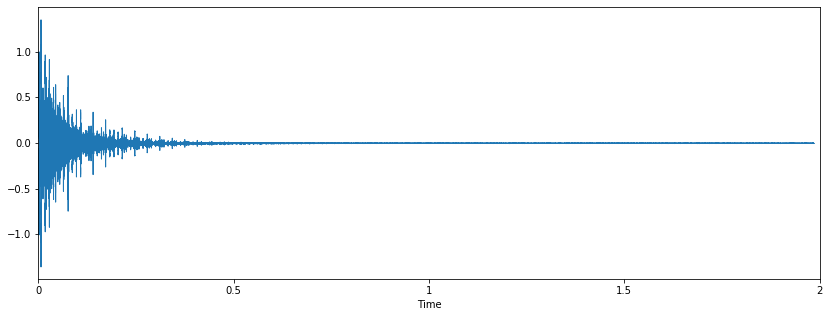

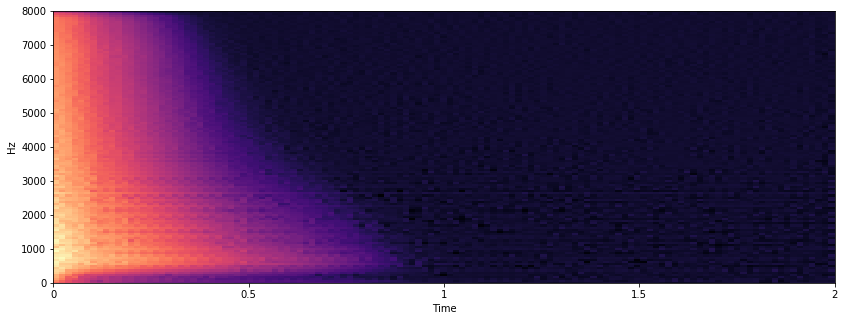

In [18]:
# Now let's "distort" an audio file by running it through the model; let's take the snare from above
input_files = [snare_file]
filename = 'single.wav'
tool.generate(filename, audio_files=input_files)
visualize_audio(filename)

Calculating embeddings for file 1 of 1
Decoding averaged embedding.
Reconstructing audio.


Calculating embeddings for file 1 of 1
Decoding averaged embedding.
Reconstructing audio.


Calculating embeddings for file 1 of 1
Decoding averaged embedding.
Reconstructing audio.


Calculating embeddings for file 1 of 1
Decoding averaged embedding.
Reconstructing audio.


Calculating embeddings for file 1 of 1
Decoding averaged embedding.
Reconstructing audio.


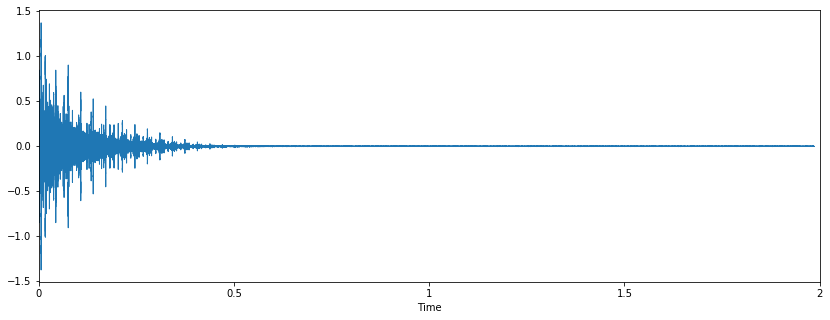

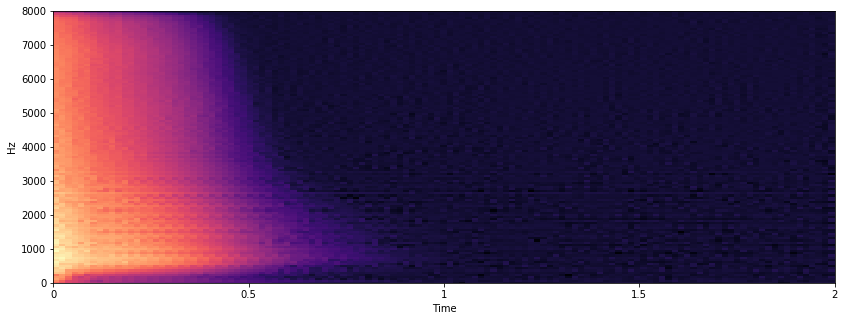

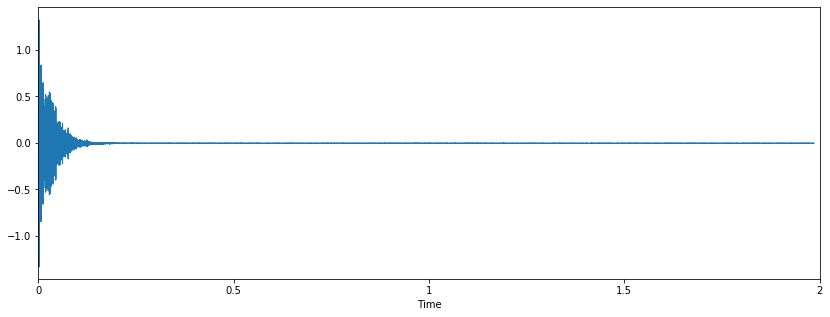

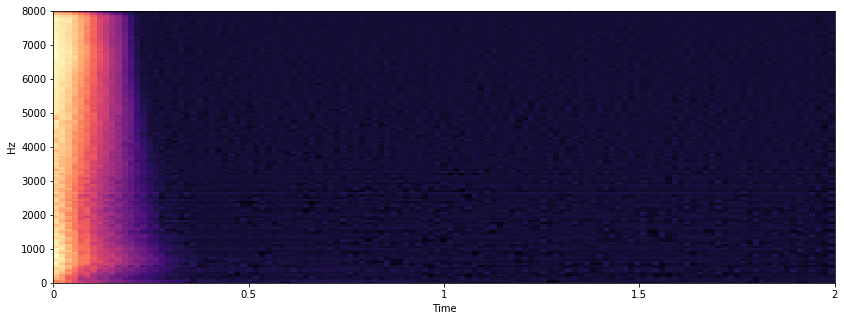

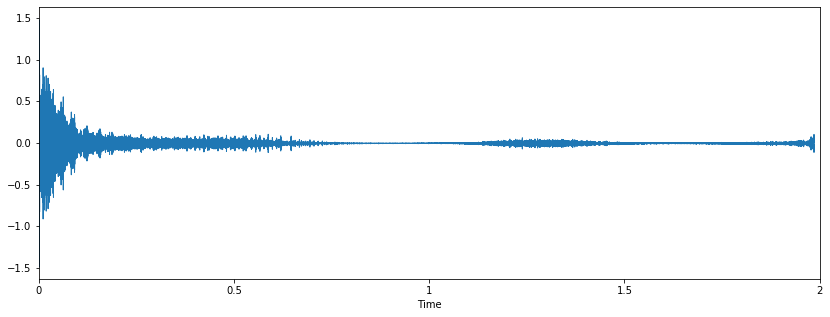

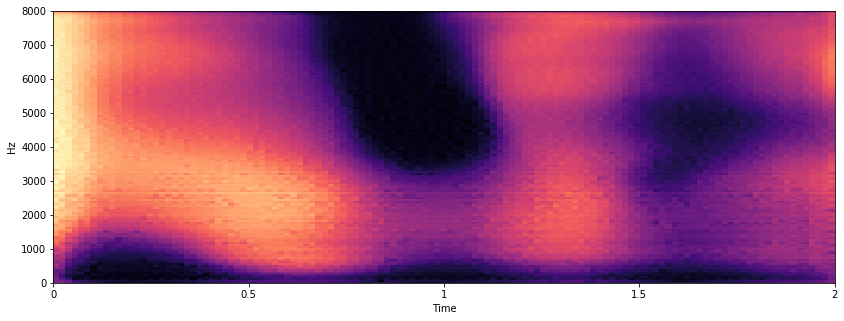

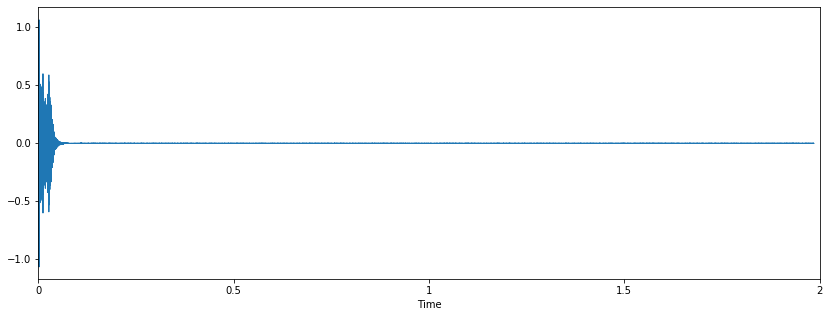

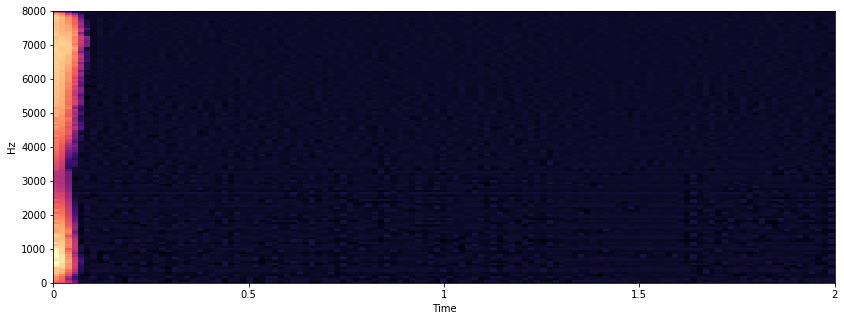

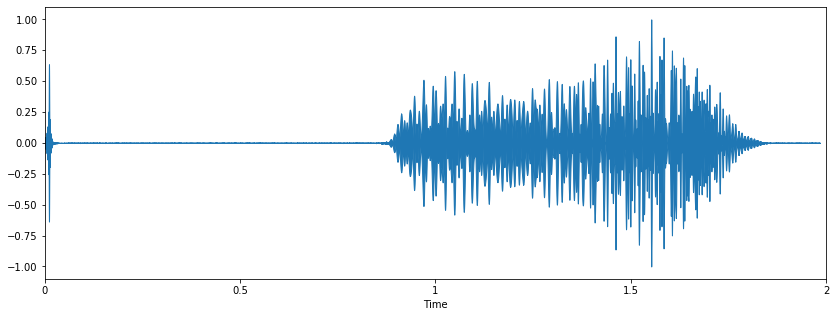

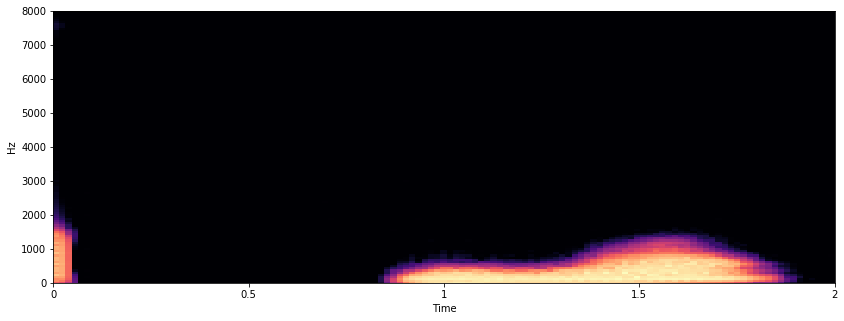

In [19]:
# We can also add some randomness using the variance parameter. Let's gradually increase the randomness
input_files = [snare_file]

for var in [0.5, 1.0, 2.0, 5.0, 20.0]:
    filename = f'single_var{var}.wav'
    tool.generate(filename, audio_files=input_files, variance=var)
    visualize_audio(filename)

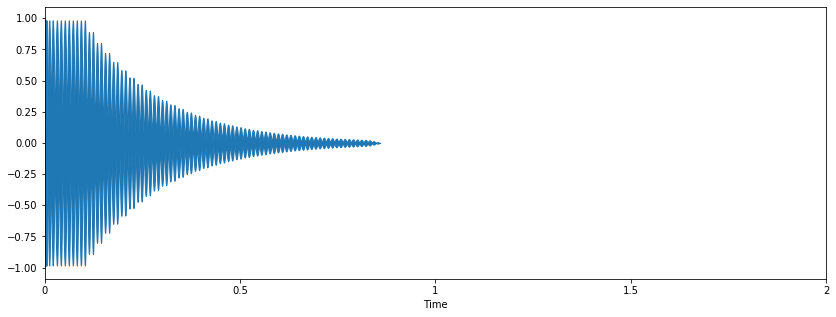

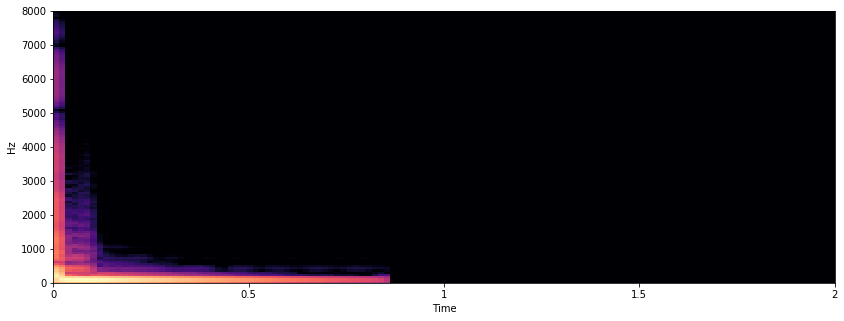

In [20]:
# Let's look at a kick sound
kick_file = '/Users/Shared/Maschine 2 Library/Samples/Drums/Kick/Kick 808 5.wav'
visualize_audio(kick_file)

Calculating embeddings for file 1 of 2
Calculating embeddings for file 2 of 2
Decoding averaged embedding.
Reconstructing audio.


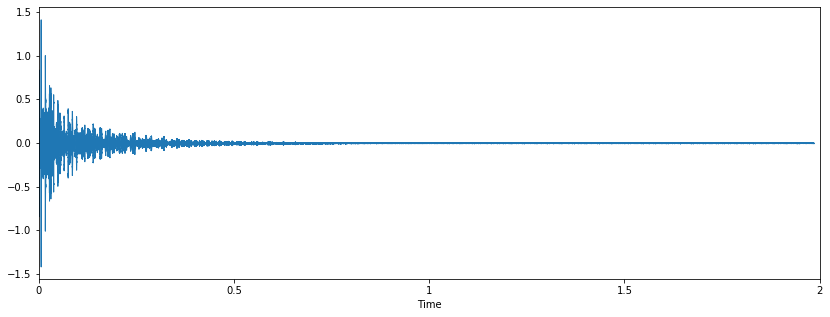

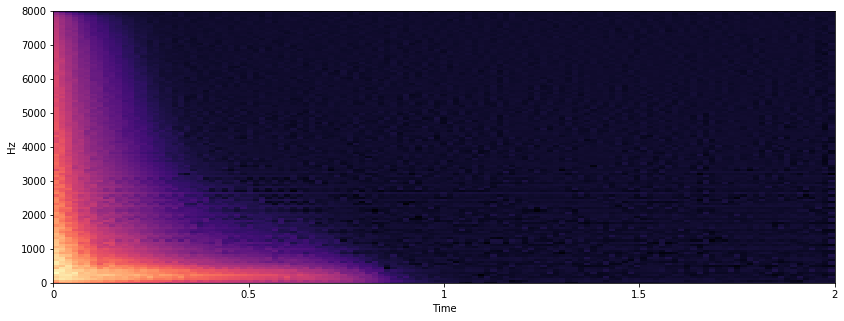

In [31]:
input_files = [snare_file, kick_file]

filename = 'double.wav'
tool.generate(filename, audio_files=input_files)
visualize_audio(filename)

Calculating embeddings for file 1 of 2
Calculating embeddings for file 2 of 2
Decoding averaged embedding.
Reconstructing audio.


Calculating embeddings for file 1 of 2
Calculating embeddings for file 2 of 2
Decoding averaged embedding.
Reconstructing audio.


Calculating embeddings for file 1 of 2
Calculating embeddings for file 2 of 2
Decoding averaged embedding.
Reconstructing audio.


Calculating embeddings for file 1 of 2
Calculating embeddings for file 2 of 2
Decoding averaged embedding.
Reconstructing audio.


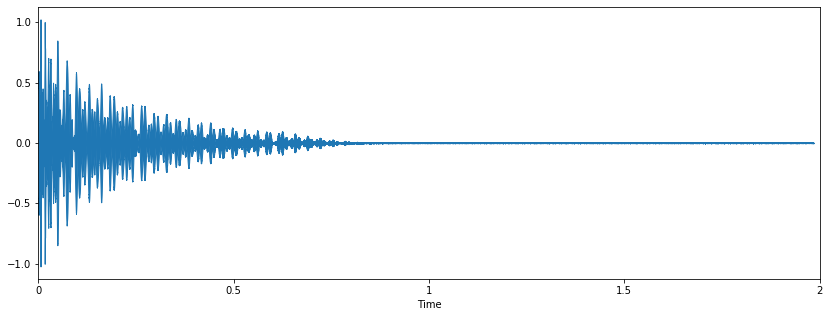

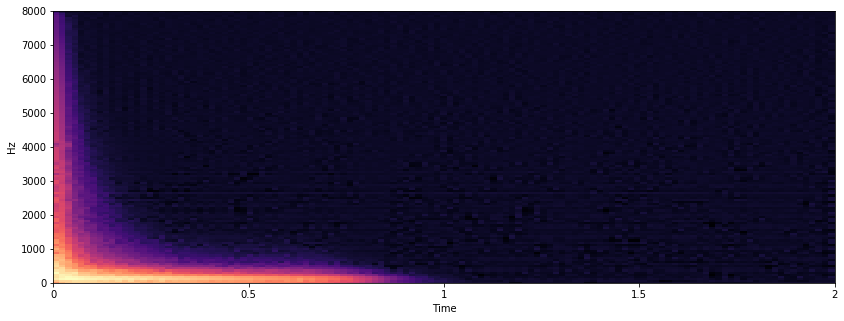

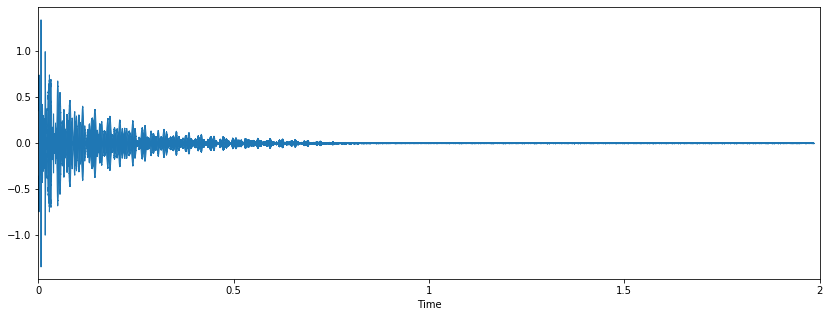

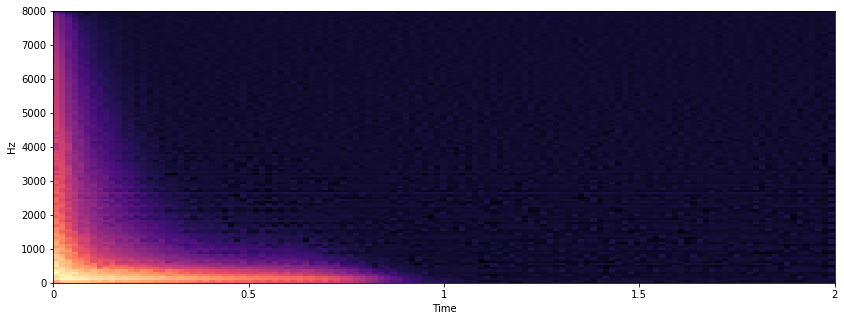

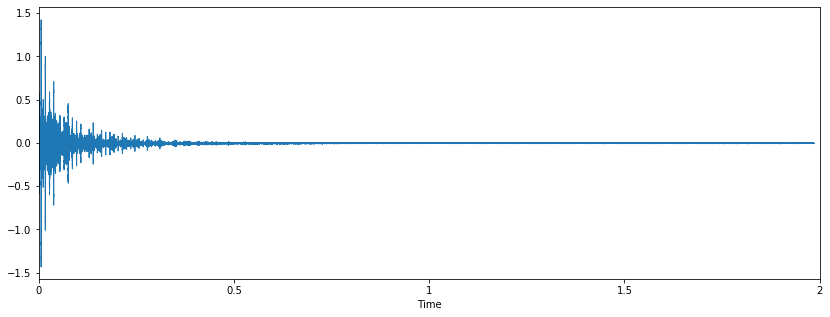

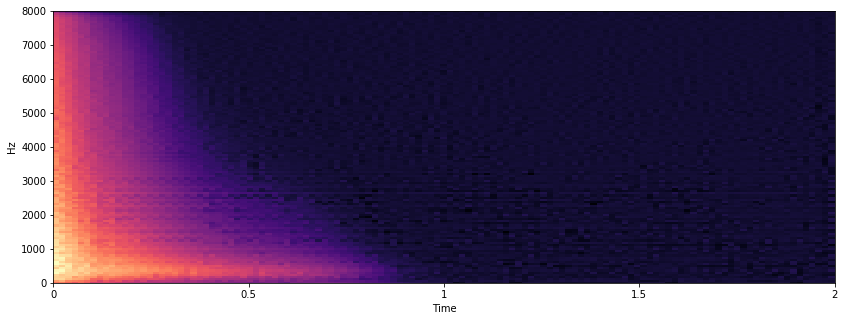

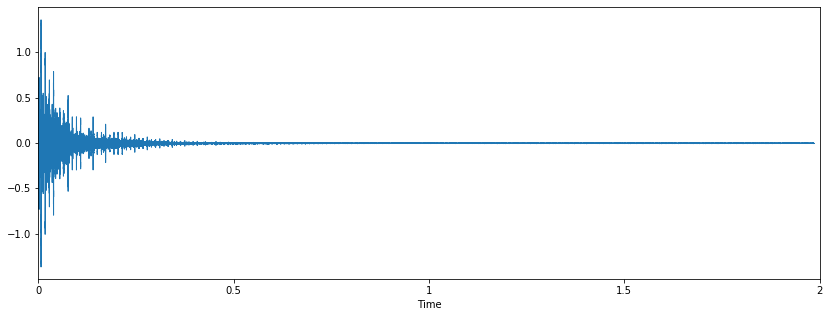

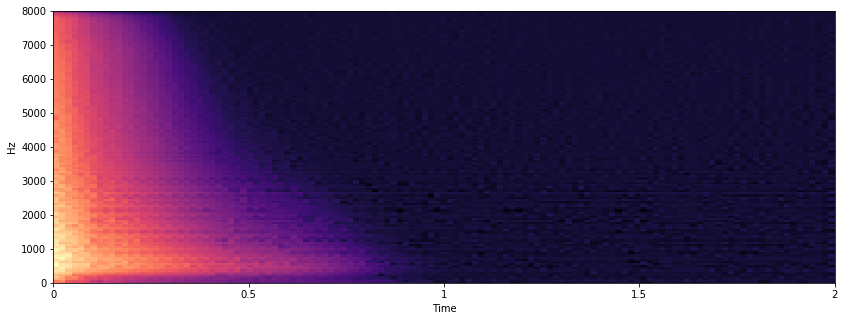

In [25]:
# And we can try differet weighted combination
input_files = [snare_file, kick_file]

weights = [ [1, 5], [1, 2], [2, 1], [5, 1] ]

for w in weights:
    filename = f'double_ratio{w[0]/w[1]}.wav'
    tool.generate(filename, audio_files=input_files, weights=w)
    visualize_audio(filename)

Calculating embeddings for file 1 of 2
Calculating embeddings for file 2 of 2
Decoding averaged embedding.
Reconstructing audio.


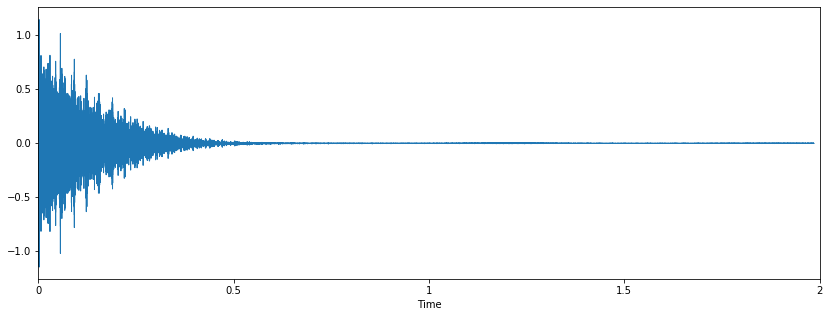

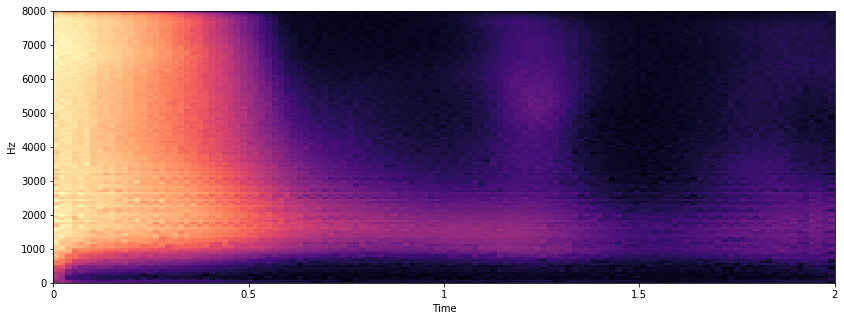

In [27]:
# Let's try and subtract the kick from the snare.
input_files = [snare_file, kick_file]
filename = f'double_subtract.wav'
tool.generate(filename, audio_files=input_files, weights=[1, -1], normalize_weights=False)
visualize_audio(filename)

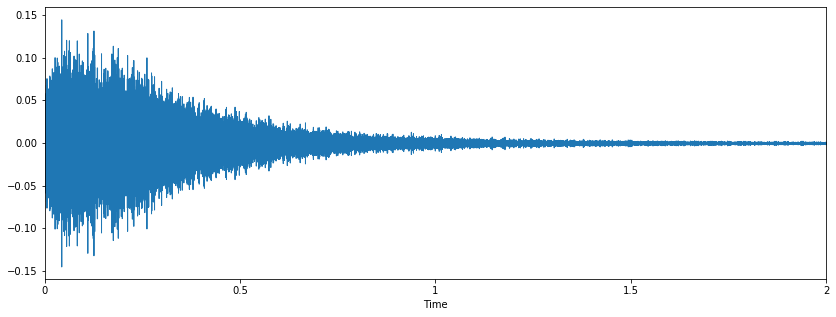

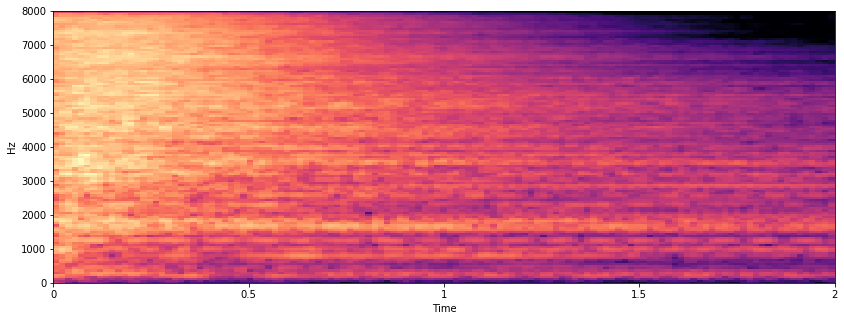

In [33]:
# Let's take one more sample, a cymbal
cymbal_file = '/Users/Shared/Maschine 2 Library/Samples/Drums/Cymbal/China Central V3.wav'
visualize_audio(cymbal_file)

Calculating embeddings for file 1 of 3
Calculating embeddings for file 2 of 3
Calculating embeddings for file 3 of 3
Decoding averaged embedding.
Reconstructing audio.


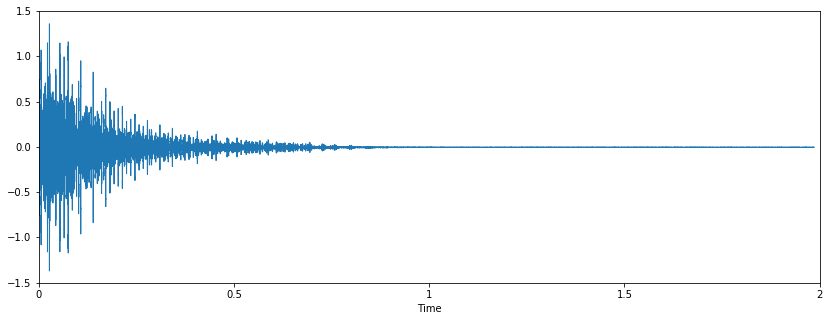

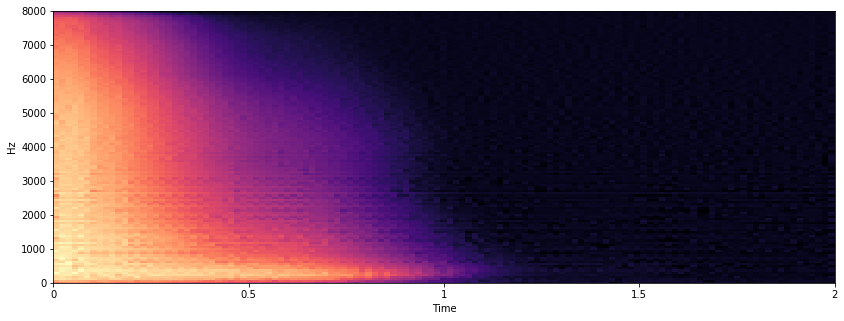

In [34]:
# Add them all together
input_files = [snare_file, kick_file, cymbal_file]
filename = f'triple.wav'
tool.generate(filename, audio_files=input_files, weights=[1, 1, 1], normalize_weights=False)
visualize_audio(filename)

Calculating embeddings for file 1 of 3
Calculating embeddings for file 2 of 3
Calculating embeddings for file 3 of 3
Decoding averaged embedding.
Reconstructing audio.


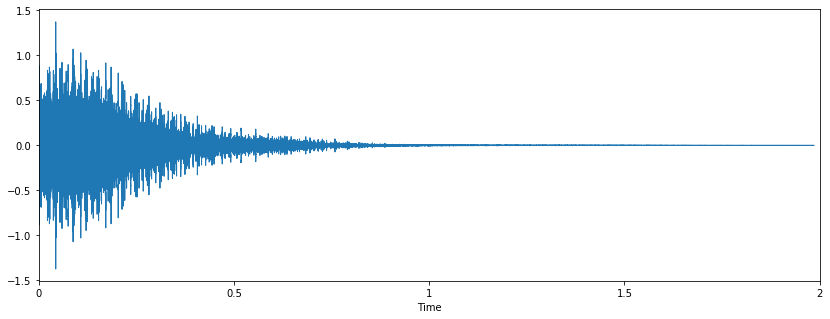

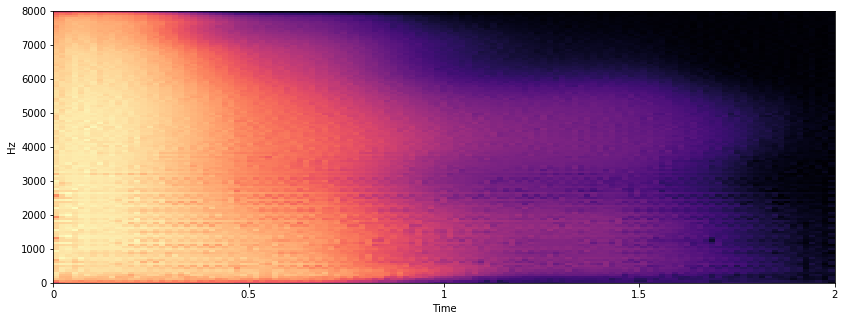

In [35]:
# Add more cymbal to get a longer decay
input_files = [snare_file, kick_file, cymbal_file]
filename = f'triple.wav'
tool.generate(filename, audio_files=input_files, weights=[1, 1, 2], normalize_weights=False)
visualize_audio(filename)

Calculating embeddings for file 1 of 3
Calculating embeddings for file 2 of 3
Calculating embeddings for file 3 of 3
Decoding averaged embedding.
Reconstructing audio.


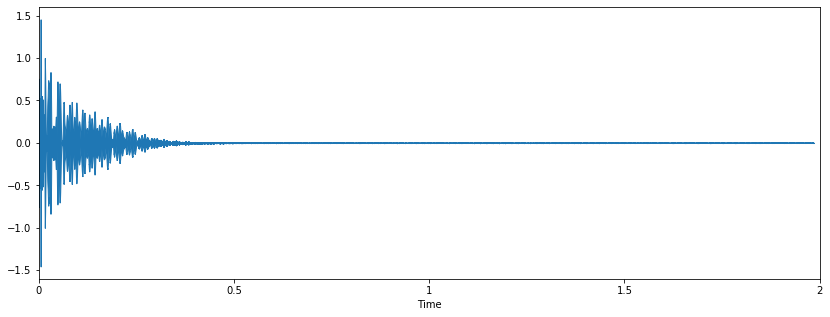

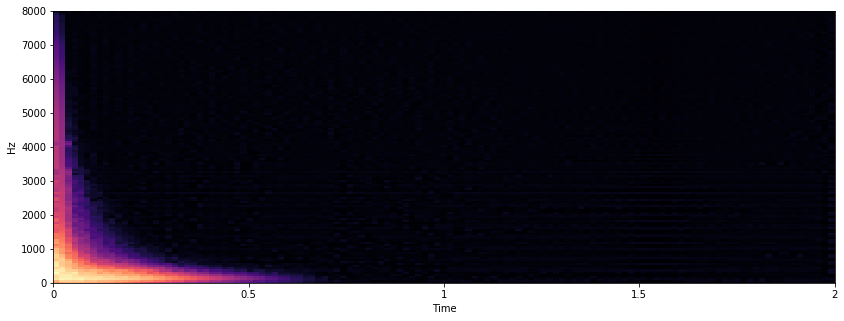

In [37]:
# Subtract the cymbal from the kick/snare combination to remove tail and high frequencies
input_files = [snare_file, kick_file, cymbal_file]
filename = f'triple.wav'
tool.generate(filename, audio_files=input_files, weights=[1, 1, -1], normalize_weights=False)
visualize_audio(filename)